In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv(r"C:\Users\mohdk\OneDrive\Desktop\DA\cleaned_airline_data.csv")

In [3]:
def sum_dur_hrs(li:list)->object:
    d,h,m,s=0,0,0,0
    for i in li:
        ti=i.split(":")
        h+=int(ti[0])
        m+=int(ti[1])
        s+=int(ti[2])
    if s>=60:
        m+=s//60
        s=s%60
    if m>=60:
        h+=m//60
        m=m%60
    if h>=24:
        d+=h//24
        h=h%24
    return f"{d} days,{h:02d}:{m:02d}:{s:02d}"


def time_range(t):
    a=t.split(":")
    re=[]
    h,m=0,0
    while h<=int(a[0]):
        while  (h<int(a[0]) and m<59) or (h==int(a[0]) and m<=int(a[1])):
            re.append((f"{h:02d}:{m:02d}:00",f"{h:02d}:{m+9:02d}:59"))
            m+=10
        h+=1
        m=0
    return re


def months(i):
    months={1:"January",2:"February",3:"March",4:"April",5:"May",6:"June",7:"July",8:"August",9:"September",10:"October",11:"November",12:"December"}
    if i in months:
        return months[i]

In [4]:
# GRAPHS REGARDING AIRLINE

Airline_cancl_deprt=pd.DataFrame.from_dict({i:
                        [df[(df["Airline"]==i) & 
                            (df["Distance_km"]==0.0)]["Flight_Number"].count(), 
                            df[(df["Airline"]==i) & 
                               (df["Distance_km"]!=0.0)]["Flight_Number"].count()] 
                               for i in df["Airline"].unique()}, 
                        orient="index",
                        columns=["Cancelled","Departed"])
Airline_flight_count_per_Origin=pd.DataFrame.from_dict({i:
                                                        {k:
                                                        [df[(df["Airline"]==i) & 
                                                            (df["Origin"]==k) & 
                                                            (df["Distance_km"]==0.0)]["Flight_Number"].count(), 
                                                            df[(df["Airline"]==i) & 
                                                               (df["Origin"]==k) & 
                                                               (df["Distance_km"]!=0.0)]["Flight_Number"].count()]
                                                            for k in j} for i,j in 
                                                            {i:df[df["Airline"]==i]["Origin"].unique() 
                                                             for i in df["Airline"].unique()}.items()}
                                                    ,orient="index")

d1=df[df["Delay_minutes"]<="00:01:00"].groupby("Airline")["Flight_Number"].count().to_dict()
d2=df[df["Delay_minutes"]>"00:01:00"].groupby("Airline")["Flight_Number"].count().to_dict()
q1=pd.DataFrame.from_dict(d1,orient="index",columns=["On-Time"]) 
q2=pd.DataFrame.from_dict(d2,orient="index",columns=["Delayed"])
Airline_On_time_delayed=pd.merge(q1,q2,left_index=True,right_index=True)

ttp=df[df["Distance_km"]!=0.0].groupby("Airline")["Ticket_Price"].sum().to_dict()
cttp=df[df["Distance_km"]==0.0].groupby("Airline")["Ticket_Price"].sum().to_dict()
tfc=df.groupby("Airline")["Fuel_Cost"].sum().to_dict()
Airline_Profits=pd.DataFrame.from_dict({i:round(ttp[i]+0.1*cttp[i]-tfc[i],2) for i in ttp},orient="index",columns=["Profit"])


adp=df[df["Distance_km"]!=0.0].groupby("Airline")["Passenger_Count"].mean().round().astype("int").to_dict()
acp=df[df["Distance_km"]==0.0].groupby("Airline")["Passenger_Count"].mean().round().astype("int").to_dict()
q1=pd.DataFrame.from_dict(adp,orient="index",columns=["Avg_Departed_Passenger"]) 
q2=pd.DataFrame.from_dict(acp,orient="index",columns=["Avg_Cancelled_Passenger"])
Airline_avg_passenger=pd.merge(q1,q2,left_index=True,right_index=True)

Airline_flight_toff_count=pd.DataFrame.from_dict({i:
                                                  {k:
                                                    list(j.values()).count(k) for k in set(j.values())}
                                                    for i,j in {i:df[(df["Airline"]==i) &
                                                                     (df["Distance_km"]!=0.0)]["Flight_Number"].value_counts().to_dict() 
                                                                     for i in df["Airline"].unique()}.items()},
                            orient="index").fillna(0).astype("int")
Airline_flight_canc_count=pd.DataFrame.from_dict({i:
                                                 {k:
                                                  list(j.values()).count(k) for k in set(j.values())}
                                                  for i,j in {i:df[(df["Airline"]==i) &
                                                                   (df["Distance_km"]==0.0)]["Flight_Number"].value_counts().to_dict()
                                                                   for i in df["Airline"].unique()}.items()},
                            orient="index").fillna(0).astype("int")              



In [5]:
Airline_cancl_deprt
Airline_flight_count_per_Origin
Airline_On_time_delayed
Airline_Profits
Airline_avg_passenger
Airline_flight_toff_count
Airline_flight_canc_count

,1,2,3,4,5
SpiceJet,1906,270,27,3,0
IndiGo,1909,257,27,3,0
GoAir,1863,250,27,3,1
Air India,1912,276,31,3,0
Vistara,1926,267,26,6,0


In [6]:
# fluiam
# plotty
# geopandas
# basemap
# scatterplot

In [7]:
# GRAPHS REGARDING AIRCRAFT_TYPE

Airline_aircraft_cancelled_departed=pd.merge(df[df["Distance_km"]==0.0].groupby(["Airline","Aircraft_Type"],as_index=False).agg(cancelled_flight=("Flight_Number","count")),
         df[df["Distance_km"]!=0.0].groupby(["Airline","Aircraft_Type"],as_index=False).agg(departed_flight=("Flight_Number","count")),
         on=["Airline","Aircraft_Type"],
         how="outer")

Aircraft_Origin_count=df[df["Distance_km"]!=0.0].groupby(["Airline","Aircraft_Type","Origin"],as_index=False).agg(flight_count=("Flight_Number","count"))
Aircraft_Destination_count=df[df["Distance_km"]!=0.0].groupby(["Airline","Aircraft_Type","Destination"],as_index=False).agg(flight_count=("Flight_Number","count"))

total_flight_time=pd.DataFrame.from_dict({i:
                                            {k:
                                                sum_dur_hrs(df[(df["Airline"]==i) & 
                                                               (df["Aircraft_Type"]==k) & 
                                                               (df["Distance_km"]!=0.0)]["Duration_hours"].tolist()) for k in j} 
                                                               for i,j in df.groupby("Airline")["Aircraft_Type"].unique().to_dict().items()},
                                            orient="index")

pass_dept_airtype_count=df[df["Distance_km"]!=0.0].groupby(["Airline","Aircraft_Type"],as_index=False).agg(passenger_count=("Passenger_Count","sum"),average_passenger=("Passenger_Count","mean"))
pass_canc_airtype_count=df[df["Distance_km"]==0.0].groupby(["Airline","Aircraft_Type"],as_index=False).agg(passenger_count=("Passenger_Count","sum"),average_passenger=("Passenger_Count","mean"))

ttp={i:{k:df[(df["Airline"]==i) & (df["Aircraft_Type"]==k) & (df["Distance_km"]!=0.0)]["Ticket_Price"].sum() for k in j} for i,j in df.groupby("Airline")["Aircraft_Type"].unique().to_dict().items()}
cttp={i:{k:df[(df["Airline"]==i) & (df["Aircraft_Type"]==k) & (df["Distance_km"]==0.0)]["Ticket_Price"].sum() for k in j} for i,j in df.groupby("Airline")["Aircraft_Type"].unique().to_dict().items()}
tfc={i:{k:df[(df["Airline"]==i) & (df["Aircraft_Type"]==k)]["Fuel_Cost"].sum() for k in j} for i,j in df.groupby("Airline")["Aircraft_Type"].unique().to_dict().items()}
Aircraft_profit=pd.DataFrame.from_dict({i:{k:round(ttp[i][k] + 0.1*cttp[i][k] - tfc[i][k],2) for k in j} for i,j in ttp.items()},orient="index")

In [8]:
total_flight_time

,B777,ATR72,A320,B737,A321
Air India,"242 days,15:45:41","381 days,21:09:21","255 days,10:06:17","262 days,16:15:15","253 days,23:42:30"
GoAir,"246 days,07:13:08","371 days,08:13:59","264 days,12:05:53","255 days,13:42:34","243 days,02:08:26"
IndiGo,"244 days,07:33:40","387 days,13:50:00","253 days,01:59:19","246 days,10:01:58","250 days,00:48:36"
SpiceJet,"234 days,06:59:25","376 days,06:08:52","255 days,04:33:38","252 days,08:52:06","251 days,11:57:18"
Vistara,"246 days,16:23:40","369 days,20:26:51","247 days,08:49:13","253 days,07:33:30","250 days,18:04:28"


In [9]:
Airline_aircraft_cancelled_departed
Aircraft_Origin_count
Aircraft_Destination_count
total_flight_time
pass_dept_airtype_count
pass_canc_airtype_count
Aircraft_profit


,B777,ATR72,A320,B737,A321
Air India,-1366226.72,1682036.26,-806848.53,-1245061.92,404489.57
GoAir,-5414992.59,-1518661.85,-4353058.54,-4549696.61,-3304746.61
IndiGo,-2660507.15,710662.23,-1996025.99,-2275904.07,-956884.48
SpiceJet,-3882923.60,-327114.82,-3112933.18,-3335482.44,-2279451.20
Vistara,1248304.81,4053470.97,1266284.87,971867.53,2962537.56


In [10]:
Aircraft_Origin_count

,Airline,Aircraft_Type,Origin,flight_count
0,Air India,A320,AMD,450
1,Air India,A320,BLR,465
2,Air India,A320,BOM,416
3,Air India,A320,CCU,424
4,Air India,A320,DEL,449
...,...,...,...,...
195,Vistara,B777,CCU,428
196,Vistara,B777,DEL,432
197,Vistara,B777,HYD,444
198,Vistara,B777,MAA,476


In [11]:
# ttp=df[df["Distance_km"]!=0.0].groupby(["Airline","Aircraft_Type"],as_index=False).agg(profit=("Ticket_Price","sum"))
# cttp=df[df["Distance_km"]==0.0].groupby(["Airline","Aircraft_Type"],as_index=False).agg(profit=("Ticket_Price","sum"))
# tfc=df.groupby(["Airline","Aircraft_Type"],as_index=False).agg(profit=("Fuel_Cost","sum"))
# # {i[0]:{i[1]:round(ttp[i] + 0.1*cttp[i] - tfc[i],2) } for i in ttp}

In [12]:


df["Date"]=pd.to_datetime(df["Date"],format="%Y-%m-%d")



In [13]:
ATRDC={i:
       {ac:
        {tr:
   df[(df["Airline"]==i) & 
      (df["Aircraft_Type"]==ac) & 
      (df["Distance_km"]!=0.0) & 
      (df["Delay_minutes"]>=tr[0]) & 
      (df["Delay_minutes"]<tr[1])]["Flight_Number"].count() 
      for tr in ltr
   } for ac,ltr in {k: 
                     time_range(max(df[(df["Airline"]==i) & 
                                       (df["Aircraft_Type"]==k) & 
                                       (df["Distance_km"]!=0.0)]["Delay_minutes"].unique().tolist())) for k in j
                        }.items() 
 }for i,j in df.groupby("Airline")["Aircraft_Type"].unique().to_dict().items()}


rows=[]
for airline,i in ATRDC.items():
    for aircraft,j in i.items():
        for tr,count in j.items():
            rows.append({
                "Airline":airline,
                "Aircraft_Type":aircraft,
                "Time_Range":tr,
                "Flight_Count":count
            })
Aircraft_Time_range_delay_count=pd.DataFrame(rows)

In [14]:
# Aircraft_Time_range_delay_count.pivot_table(index=["Airline","Aircraft_Type"],columns="Time_Range",values="Flight_Count",fill_value=0).astype("int").reset_index()

In [15]:
df["Date"]=pd.to_datetime(df["Date"],format="%Y-%m-%d")


In [16]:
# {i:{k:df[(df["Date"].dt.month==i) & 
#          (df["Date"].dt.day==k) & 
#          (df["Distance_km"]!=0.0)]["Flight_Number"].count() for k in j } 
#          for i,j in df.assign(month=df["Date"].dt.month,day=df["Date"].dt.day).groupby("month")["day"].unique().to_dict().items()}



DFC=df[df["Distance_km"]!=0.0].assign(month=df["Date"].dt.month,
                                  day=df["Date"].dt.day).groupby(["month","day"],
                                                                                as_index=False).agg(flight_count=("Flight_Number","count")).pivot_table(index="month",
                                                                                                                                                        columns="day",
                                                                                                                                                        values="flight_count",
                                                                                                                                                        fill_value=0).astype("int").reset_index()



DFC["month"]=DFC["month"].apply(lambda x:months(x))
DFC.set_index("month",inplace=True)
DFC

day,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
month,,,,,,,,,,,,,,,,,,,,,
January,239,221,248,227,246,236,258,219,237,247,...,256,222,235,251,217,223,227,211,234,251
February,236,211,250,236,263,261,209,248,253,221,...,240,246,235,226,244,235,267,0,0,0
March,238,210,242,255,249,243,268,232,257,245,...,213,259,263,221,259,256,237,237,227,256
April,232,220,215,250,244,241,245,244,257,248,...,268,222,216,253,225,252,248,233,239,0
May,245,240,254,225,245,234,238,232,218,221,...,240,233,250,218,231,211,232,239,250,214
June,224,258,245,244,276,228,263,241,262,217,...,213,237,246,239,251,249,281,241,218,0
July,225,229,228,260,271,247,236,245,232,223,...,251,269,229,234,237,247,216,225,244,229
August,232,242,257,254,231,244,224,227,250,246,...,260,232,214,254,214,234,240,216,232,239
September,240,233,243,234,248,247,256,266,240,228,...,301,246,219,248,235,260,225,258,221,0


In [17]:
ADPC=df[df["Distance_km"]!=0.0].assign(month=df["Date"].dt.month,
                                       day=df["Date"].dt.day).groupby(["Airline","month","day"],
                                                                      as_index=False).agg(Passenger_count=("Passenger_Count","sum")).pivot_table(index=["Airline","month"],
                                                                                                                                                 columns="day",
                                                                                                                                                 values="Passenger_count",
                                                                                                                                                 fill_value=0).astype("int").reset_index()

ADPC["month"]=ADPC["month"].apply(lambda x:months(x))
ADPC

day,Airline,month,1,2,3,4,5,6,7,8,...,22,23,24,25,26,27,28,29,30,31
0,Air India,January,6480,7366,7229,6906,5964,6923,9718,6946,...,7794,5975,6882,8075,6492,7984,5398,6715,8136,7004
1,Air India,February,6998,6873,8658,4931,8256,8157,6184,4609,...,7705,8851,9460,5402,6174,8976,8167,0,0,0
2,Air India,March,5490,7089,7666,6171,5985,8384,9857,5909,...,6766,8063,6786,5654,5883,7459,8425,7853,8389,7217
3,Air India,April,6559,5649,5606,7316,7216,8271,6828,7005,...,7008,6671,5470,7477,6436,10110,7406,8581,7003,0
4,Air India,May,6349,7017,8891,5389,8944,4799,5818,4805,...,6888,5943,7676,7629,7169,6630,7378,6567,8440,5754
5,Air India,June,3370,7782,7683,7962,7990,7072,8336,7776,...,6761,6637,7149,6648,7231,9266,8725,7313,6507,0
6,Air India,July,4988,6802,7875,9186,8350,7616,7879,6963,...,8473,6456,5320,8136,8611,7282,4979,6157,8436,6004
7,Air India,August,5305,6951,7352,9203,7351,7811,6619,8544,...,7369,4777,6618,8720,7525,6409,8709,7431,8080,8064
8,Air India,September,6946,7146,9174,7782,6988,7206,8953,7788,...,9878,8509,7806,6191,8670,6947,8908,7615,6328,0
9,Air India,October,9996,7622,6713,7828,8457,7087,7680,4670,...,8076,6874,7682,7514,6183,7368,6777,7183,7513,7130


In [18]:
AADPC=df[df["Distance_km"]!=0.0].assign(month=df["Date"].dt.month,
                                       day=df["Date"].dt.day).groupby(["Airline","Aircraft_Type","month","day"],
                                                                      as_index=False).agg(Passenger_count=("Passenger_Count","sum")).pivot_table(index=["Airline","Aircraft_Type","month"],
                                                                                                                                                 columns="day",
                                                                                                                                                 values="Passenger_count",
                                                                                                                                                 fill_value=0).astype("int").reset_index()

AADPC["month"]=AADPC["month"].apply(lambda x:months(x))
AADPC

day,Airline,Aircraft_Type,month,1,2,3,4,5,6,7,...,22,23,24,25,26,27,28,29,30,31
0,Air India,A320,January,890,1402,1457,892,1598,1270,1721,...,1087,899,1856,1098,1153,1400,819,1653,1717,1025
1,Air India,A320,February,1474,918,1808,630,1700,1671,1139,...,1152,1599,1219,1205,1192,2001,1169,0,0,0
2,Air India,A320,March,1020,638,1027,652,1623,1802,1731,...,1318,1071,1652,1349,583,1156,1432,1299,1793,1000
3,Air India,A320,April,1545,1043,632,667,2310,1262,1360,...,986,1731,1326,665,1009,2820,1942,1483,1561,0
4,Air India,A320,May,945,675,1836,1501,1655,704,1642,...,1056,1125,1559,1246,1223,1002,1871,1085,1261,977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,Vistara,B777,August,2298,2614,4158,3004,2710,2844,1457,...,3217,2102,3055,4069,2085,2789,3621,3781,1850,1923
296,Vistara,B777,September,2085,2232,1717,1359,3751,3543,1330,...,4122,1485,2014,1040,3662,3326,3541,2865,1717,0
297,Vistara,B777,October,2375,1331,3583,4037,3360,3236,2560,...,3698,1671,2294,1927,2482,2319,2377,5375,3732,2813
298,Vistara,B777,November,2383,2421,2934,1762,2168,1394,1768,...,3479,1562,2093,2508,2128,1787,2157,1603,2447,0


In [19]:
# PLOTTING

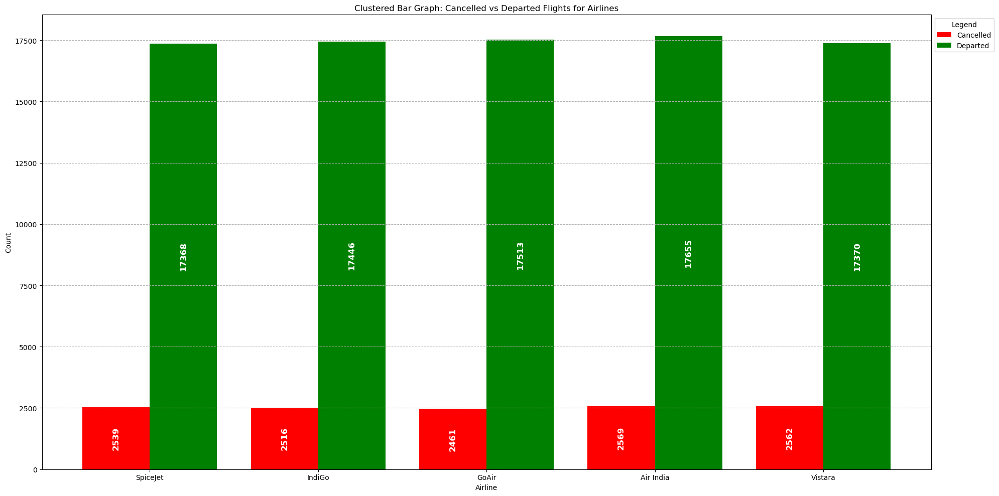

In [20]:
plt.figure(figsize=(20,10))
air=Airline_cancl_deprt.index
x=np.arange(len(air))
col=Airline_cancl_deprt.columns
width=0.8/len(col)
width

b1=plt.bar(x-width/2,Airline_cancl_deprt["Cancelled"],width=width,color="red",label="Cancelled")
plt.bar_label(b1,label_type="center",color="white",fontweight="bold",fontsize="12",rotation=90)


b2=plt.bar(x+width/2,Airline_cancl_deprt["Departed"],width=width,color="green",label="Departed")
plt.bar_label(b2,label_type="center",color="white",fontweight="bold",fontsize="12",rotation=90)


plt.xticks(x,air)
plt.xlabel("Airline")
plt.ylabel("Count")
plt.title("Clustered Bar Graph: Cancelled vs Departed Flights for Airlines")
plt.legend(title="Legend",bbox_to_anchor=(1,1))
plt.grid(axis="y",linestyle="--")
plt.tight_layout()
plt.show()

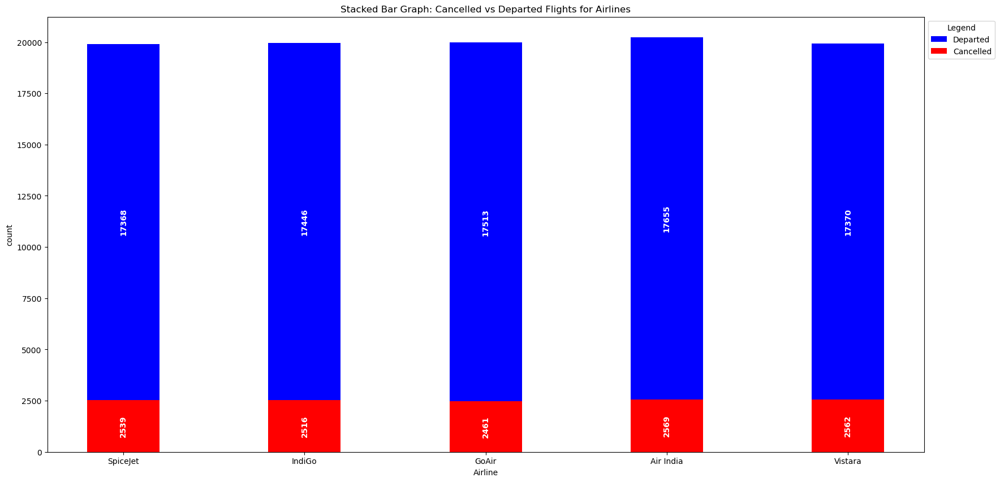

In [21]:
plt.figure(figsize=(20,10))
air=Airline_cancl_deprt.index
air
x=np.arange(len(air))
b1=plt.bar(x,Airline_cancl_deprt["Departed"],bottom=Airline_cancl_deprt["Cancelled"],width=0.4,color="blue",label="Departed")
b2=plt.bar(x,Airline_cancl_deprt["Cancelled"],width=0.4,color="red",label="Cancelled")

plt.bar_label(b1,label_type="center",color="white",fontweight="bold",rotation=90)
plt.bar_label(b2,label_type="center",color="white",fontweight="bold",rotation=90)
plt.xticks(x,air)
plt.xlabel("Airline")
plt.ylabel("count")
plt.title("Stacked Bar Graph: Cancelled vs Departed Flights for Airlines")
plt.legend(title="Legend",bbox_to_anchor=(1,1))
plt.show()

In [22]:
Airline_cancl_deprt

,Cancelled,Departed
SpiceJet,2539,17368
IndiGo,2516,17446
GoAir,2461,17513
Air India,2569,17655
Vistara,2562,17370


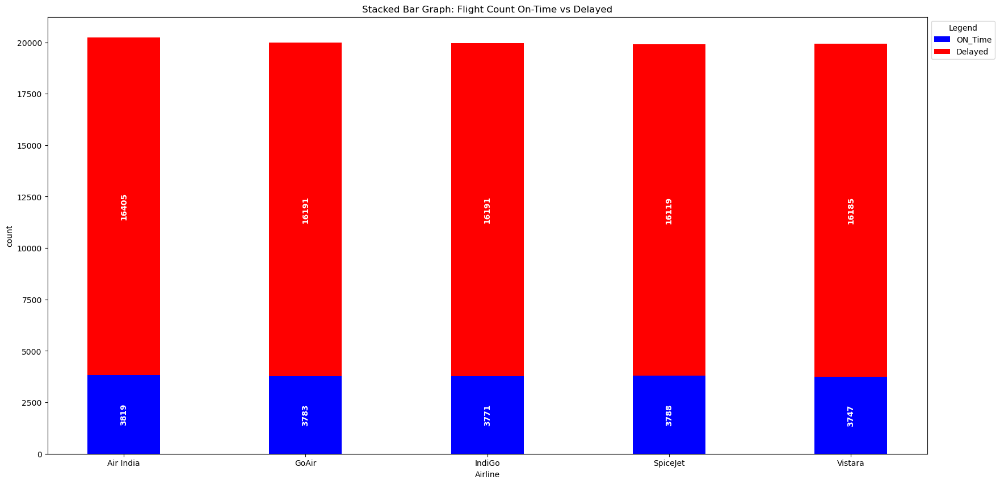

In [23]:
plt.figure(figsize=(20,10))
air=Airline_On_time_delayed.index
x=np.arange(len(air))
d1=plt.bar(x,Airline_On_time_delayed["On-Time"],width=0.4,color="blue",label="ON_Time")
d2=plt.bar(x,Airline_On_time_delayed["Delayed"],bottom=Airline_On_time_delayed["On-Time"],width=0.4,color="red",label="Delayed")

plt.bar_label(d1,label_type="center",color="white",fontweight="bold",rotation=90)
plt.bar_label(d2,label_type="center",color="white",fontweight="bold",rotation=90)
plt.xticks(x,air)
plt.xlabel("Airline")
plt.ylabel("count")
plt.title("Stacked Bar Graph: Flight Count On-Time vs Delayed")
plt.legend(title="Legend",bbox_to_anchor=(1,1))
plt.show()

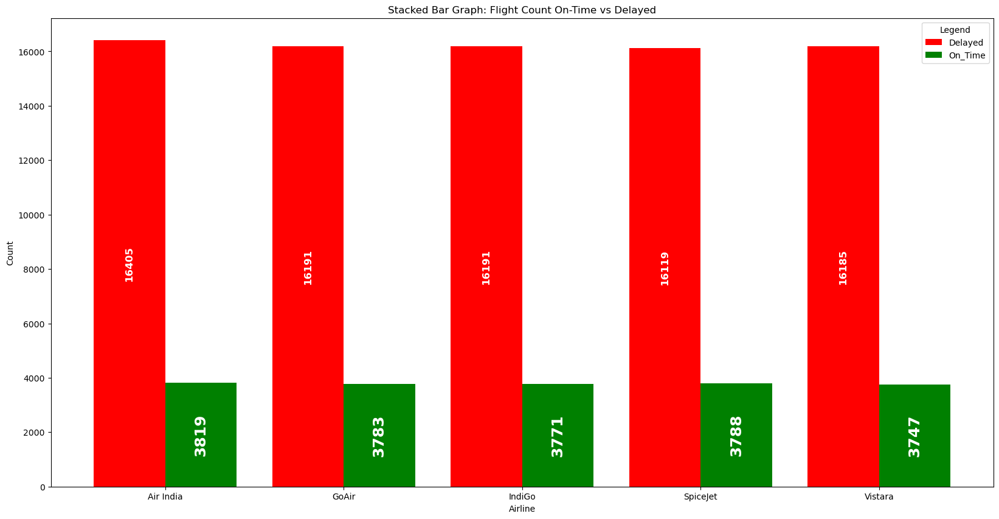

In [24]:
plt.figure(figsize=(20,10))
air=Airline_On_time_delayed.index
x=np.arange(len(air))
col=Airline_On_time_delayed.columns
width=0.8/len(col)
width

b1=plt.bar(x-width/2,Airline_On_time_delayed["Delayed"],width=width,color="red",label="Delayed")
plt.bar_label(b1,label_type="center",color="white",fontweight="bold",fontsize="12",rotation=90)

b2=plt.bar(x+width/2,Airline_On_time_delayed["On-Time"],width=width,color="green",label="On_Time")
plt.bar_label(b2,label_type="center",color="white",fontweight="bold",fontsize="18",rotation=90)


plt.xticks(x,air)
plt.xlabel("Airline")
plt.ylabel("Count")
plt.title("Stacked Bar Graph: Flight Count On-Time vs Delayed")
plt.legend(title="Legend",bbox_to_anchor=(1,1))
plt.show()

In [25]:
Airline_On_time_delayed

,On-Time,Delayed
Air India,3819,16405
GoAir,3783,16191
IndiGo,3771,16191
SpiceJet,3788,16119
Vistara,3747,16185


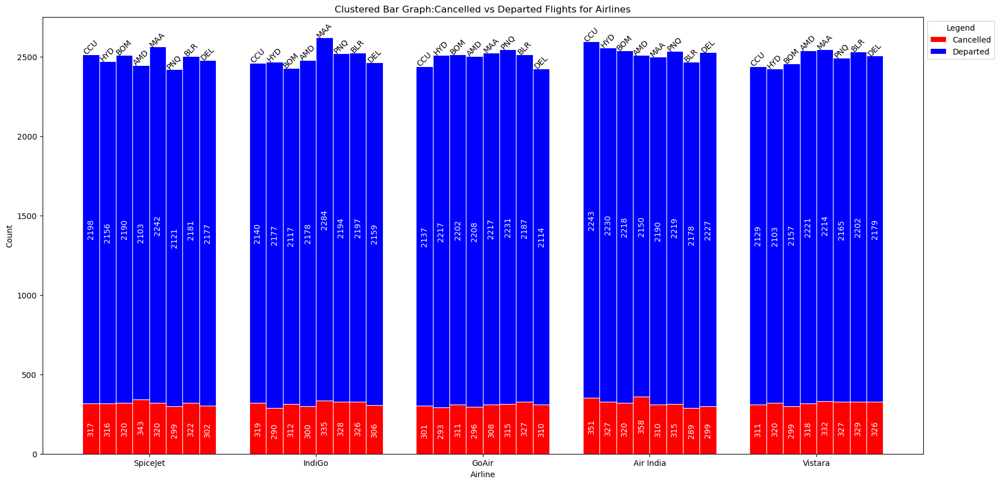

In [26]:
plt.figure(figsize=(20,10))
air=Airline_flight_count_per_Origin.index
origins=Airline_flight_count_per_Origin.columns
x=np.arange(len(air))
width=0.8
bar_width=width/len(origins)
for i,airline in enumerate(air):
    start=x[i]-width/2+bar_width/2
    for j,origin in enumerate(origins):
        bottom=0
        xpo=start+j*bar_width
        val=Airline_flight_count_per_Origin.iloc[i,j]
        b1=plt.bar(xpo,val[0],width=bar_width,bottom=bottom,color="red",label="Cancelled" if (i==0 and j==0) else None,edgecolor="white",linewidth=0.8)
        bottom+=val[0]
        b2=plt.bar(xpo,val[1],width=bar_width,bottom=bottom,color="blue",label="Departed" if (i==0 and j==0) else None,edgecolor="white",linewidth=0.8)
        bottom+=val[1]
        plt.bar_label(b1,label_type="center",color="white",rotation=90)
        plt.bar_label(b2,label_type="center",color="white",rotation=90)
        plt.text(xpo,bottom+1,origin,color="black",ha="center",rotation=45)
plt.xticks(x,air)
plt.xlabel("Airline")
plt.ylabel("Count")
plt.title("Clustered Bar Graph:Cancelled vs Departed Flights for Airlines")
plt.legend(title="Legend",bbox_to_anchor=(1,1))
plt.show()


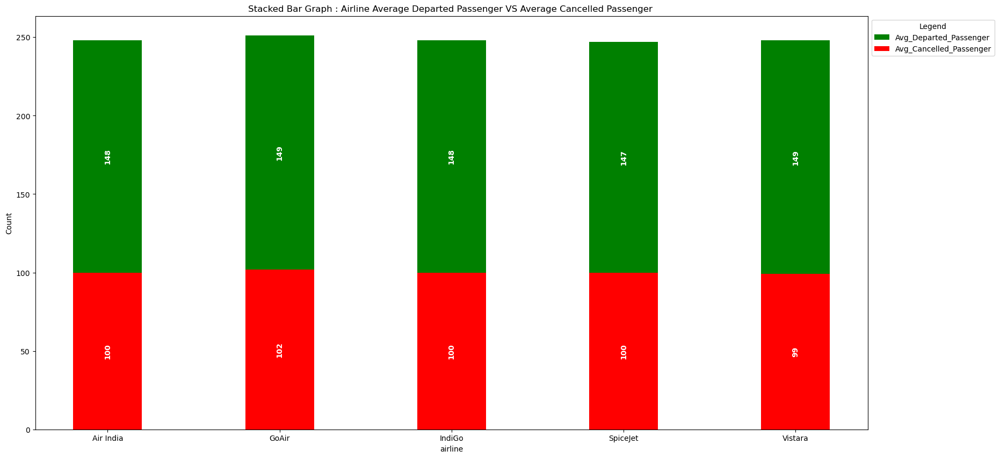

In [27]:
plt.figure(figsize=(20,10))
air=Airline_avg_passenger.index
x=np.arange(len(air))
b1=plt.bar(x,Airline_avg_passenger["Avg_Departed_Passenger"],bottom=Airline_avg_passenger["Avg_Cancelled_Passenger"],width=0.4,color="green",label="Avg_Departed_Passenger")
plt.bar_label(b1,label_type="center",color="white",fontweight="bold",rotation=90)

b2=plt.bar(x,Airline_avg_passenger["Avg_Cancelled_Passenger"],width=0.4,color="red",label="Avg_Cancelled_Passenger")
plt.bar_label(b2,label_type="center",color="white",fontweight="bold",rotation=90)

plt.xticks(x,air)
plt.xlabel("airline")
plt.ylabel("Count")
plt.title("Stacked Bar Graph : Airline Average Departed Passenger VS Average Cancelled Passenger ")
plt.legend(title="Legend",bbox_to_anchor=(1,1))
plt.show()

In [28]:
Airline_avg_passenger

,Avg_Departed_Passenger,Avg_Cancelled_Passenger
Air India,148,100
GoAir,149,102
IndiGo,148,100
SpiceJet,147,100
Vistara,149,99


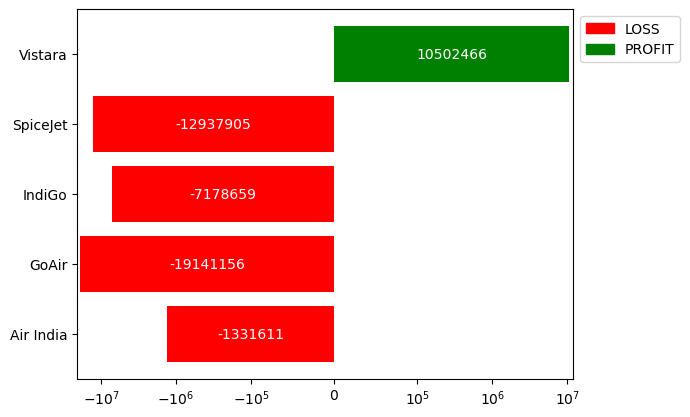

In [29]:
from matplotlib.patches import Patch

b1=plt.barh(list(Airline_Profits.index),list(Airline_Profits["Profit"]),color=["red" if i<0 else "green" for i in Airline_Profits["Profit"].tolist()])
plt.bar_label(b1,label_type="center",fmt="%.0f",color="white")
plt.legend(handles=[Patch(color="red",label="LOSS"),Patch(color="green",label="PROFIT")],bbox_to_anchor=(1,1))
plt.xscale("symlog",linthresh=1e5)



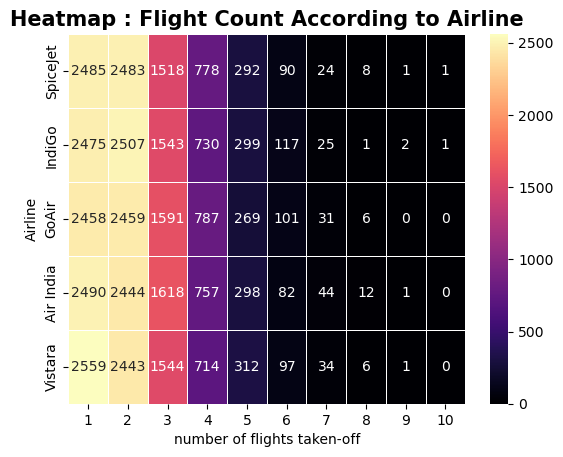

In [30]:
# plt.figure(figsize=(20,10))
sns.heatmap(Airline_flight_toff_count,annot=True,fmt="d",cmap="magma",linecolor="white",linewidth=0.5)
plt.xlabel("number of flights taken-off")
plt.ylabel("Airline")
plt.title("Heatmap : Flight Count According to Airline",fontsize=15,fontweight="bold")
plt.show()

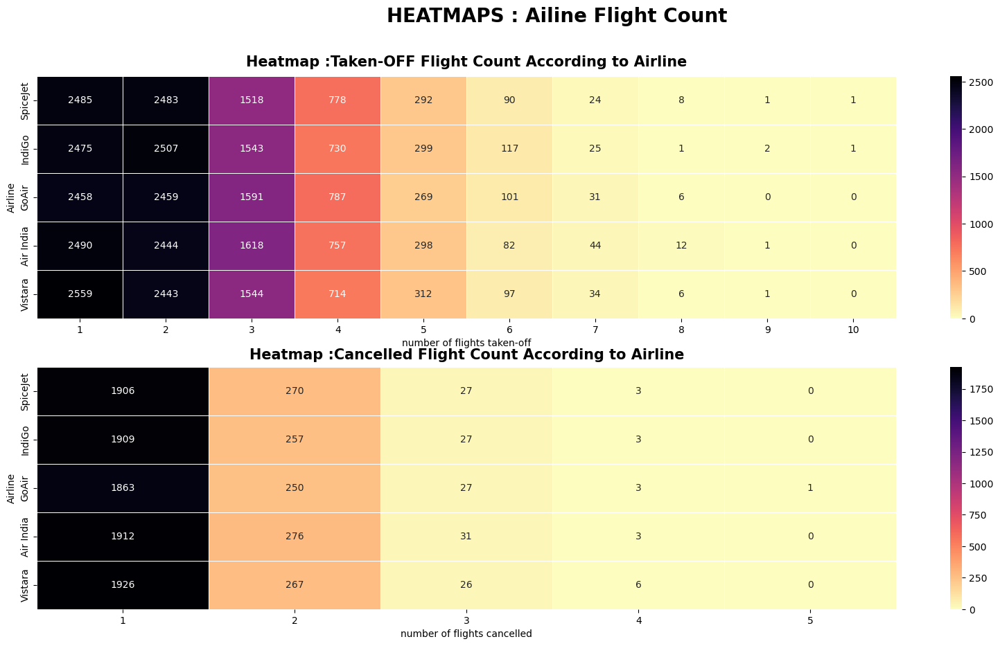

In [31]:
fig,(ax1,ax2)=plt.subplots(2,1,figsize=(20,10))
sns.heatmap(Airline_flight_toff_count,ax=ax1,annot=True,fmt="d",cmap="magma_r",linecolor="white",linewidth=0.5)
sns.heatmap(Airline_flight_canc_count,ax=ax2,annot=True,fmt="d",cmap="magma_r",linecolor="white",linewidth=0.5)
ax1.set_xlabel("number of flights taken-off")
ax2.set_xlabel("number of flights cancelled")
ax1.set_ylabel("Airline")
ax2.set_ylabel("Airline")
ax1.set_title("Heatmap :Taken-OFF Flight Count According to Airline",fontsize=15,fontweight="bold",pad="10")
ax2.set_title("Heatmap :Cancelled Flight Count According to Airline",fontsize=15,fontweight="bold",pad="8")
plt.suptitle("HEATMAPS : Ailine Flight Count",fontsize=20,fontweight="bold")
plt.show()

In [32]:
Airline_aircraft_cancelled_departed

,Airline,Aircraft_Type,cancelled_flight,departed_flight
0,Air India,A320,506,3528
1,Air India,A321,515,3532
2,Air India,ATR72,552,3502
3,Air India,B737,469,3593
4,Air India,B777,527,3500
5,GoAir,A320,486,3641
6,GoAir,A321,514,3401
7,GoAir,ATR72,468,3436
8,GoAir,B737,502,3500
9,GoAir,B777,491,3535


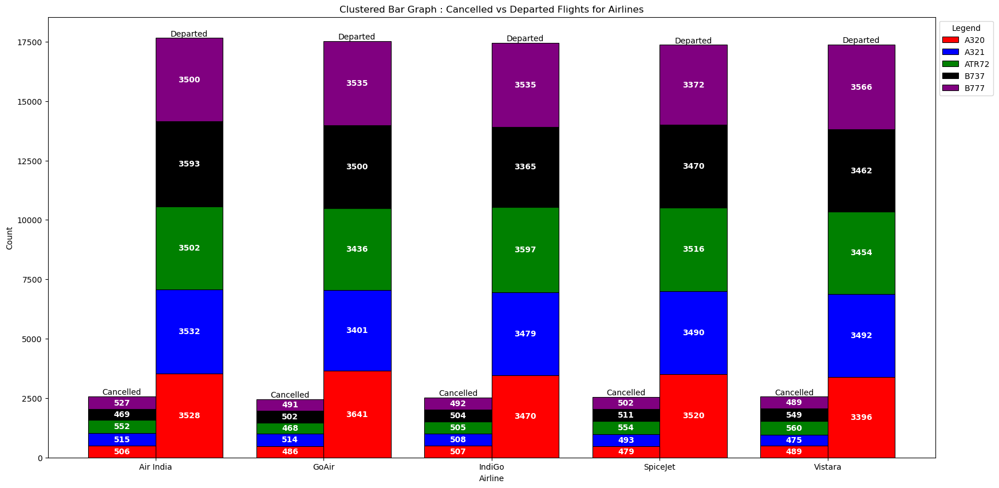

In [33]:
air=Airline_aircraft_cancelled_departed["Airline"].unique()
Aircrafts=Airline_aircraft_cancelled_departed["Aircraft_Type"].unique()
x=np.arange(len(air))
width=0.8/2
fig,ax=plt.subplots(figsize=(20,10))
color=["red","blue","green","black","purple"]
for i,airline in enumerate(air):
    sub=Airline_aircraft_cancelled_departed[Airline_aircraft_cancelled_departed["Airline"]==airline].pivot_table(index="Aircraft_Type",
                                                                                                                 values=["cancelled_flight",
                                                                                                                         "departed_flight"]).astype("int")
    
    for w,j in enumerate(sub.columns):
        bottom=0
        xpo=x[i]-width/2+w*width
        for k,aircraft in enumerate(Aircrafts):
            b1=ax.bar(xpo,sub.loc[aircraft,j],width,bottom=bottom,color=color[k],label=aircraft if (i==0 and w==0) else None,edgecolor="black",linewidth=0.8)
            ax.bar_label(b1,label_type="center",color="white",fontweight="bold")
            bottom+=sub.loc[aircraft,j]
        ax.text(xpo,bottom+10,"Cancelled" if w==0 else "Departed",ha="center",va="bottom")

ax.set_xticks(x)
ax.set_xticklabels(air)
plt.xlabel("Airline")
plt.ylabel("Count")
plt.title("Clustered Bar Graph : Cancelled vs Departed Flights for Airlines")
plt.legend(title="Legend",bbox_to_anchor=(1,1))
plt.show()

In [34]:
Aircraft_Origin_count

,Airline,Aircraft_Type,Origin,flight_count
0,Air India,A320,AMD,450
1,Air India,A320,BLR,465
2,Air India,A320,BOM,416
3,Air India,A320,CCU,424
4,Air India,A320,DEL,449
...,...,...,...,...
195,Vistara,B777,CCU,428
196,Vistara,B777,DEL,432
197,Vistara,B777,HYD,444
198,Vistara,B777,MAA,476


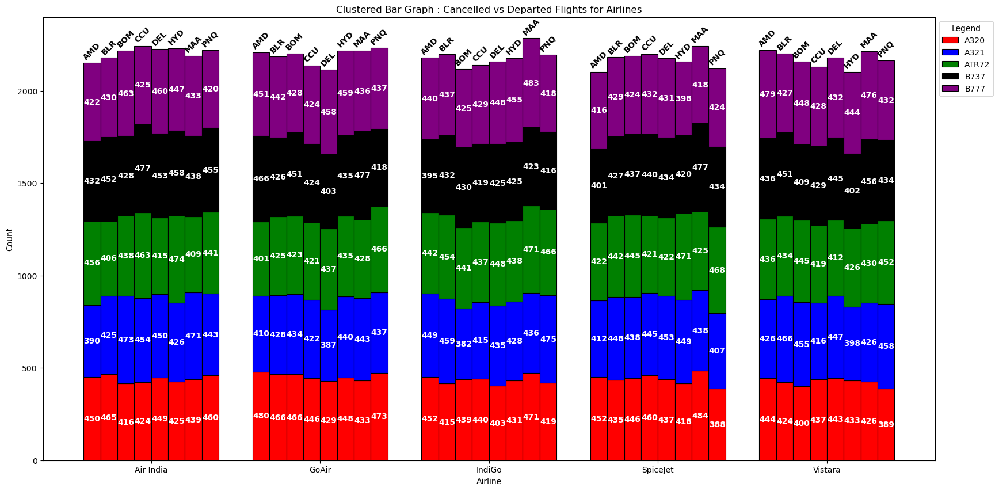

In [35]:
air=Aircraft_Origin_count["Airline"].unique()
aircrafts=Aircraft_Origin_count["Aircraft_Type"].unique()
x=np.arange(len(air))
origins=Aircraft_Origin_count["Origin"].unique()
color=["red","blue","green","black","purple"]
fig,ax=plt.subplots(figsize=(20,10))
width=0.8
barwidth=width/len(origins)
for i,airline in enumerate(air):
    sub=Aircraft_Origin_count[Aircraft_Origin_count["Airline"]==airline].pivot_table(index="Origin",
                                                                                     columns="Aircraft_Type",
                                                                                     values="flight_count").astype("int")
    start=x[i]-width/2+barwidth/2
    for j,origin in enumerate(origins):
        xpo=start+j*bar_width
        bottom=0
        for k,aircraft in enumerate(aircrafts):
            val=sub.loc[origin,aircraft]
            b1=ax.bar(xpo,val,barwidth,bottom=bottom,color=color[k],label=aircraft if (i==0 and j==0) else None,edgecolor="black",linewidth=0.8)
            bottom+=val
            ax.bar_label(b1,label_type="center",color="white",fontweight="bold")
        ax.text(xpo,bottom+10,origin,ha="center",va="bottom",fontweight="bold",rotation=45)
ax.set_xticks(x)
ax.set_xticklabels(air)
plt.xlabel("Airline")
plt.ylabel("Count")
plt.title("Clustered Bar Graph : Cancelled vs Departed Flights for Airlines")
plt.legend(title="Legend",bbox_to_anchor=(1,1))
plt.show()


In [36]:
pass_dept_airtype_count

,Airline,Aircraft_Type,passenger_count,average_passenger
0,Air India,A320,472104,133.816327
1,Air India,A321,580391,164.323613
2,Air India,ATR72,181645,51.868932
3,Air India,B737,468971,130.523518
4,Air India,B777,914245,261.212857
5,GoAir,A320,488507,134.168360
6,GoAir,A321,558929,164.342546
7,GoAir,ATR72,178557,51.966531
8,GoAir,B737,455618,130.176571
9,GoAir,B777,926036,261.962093


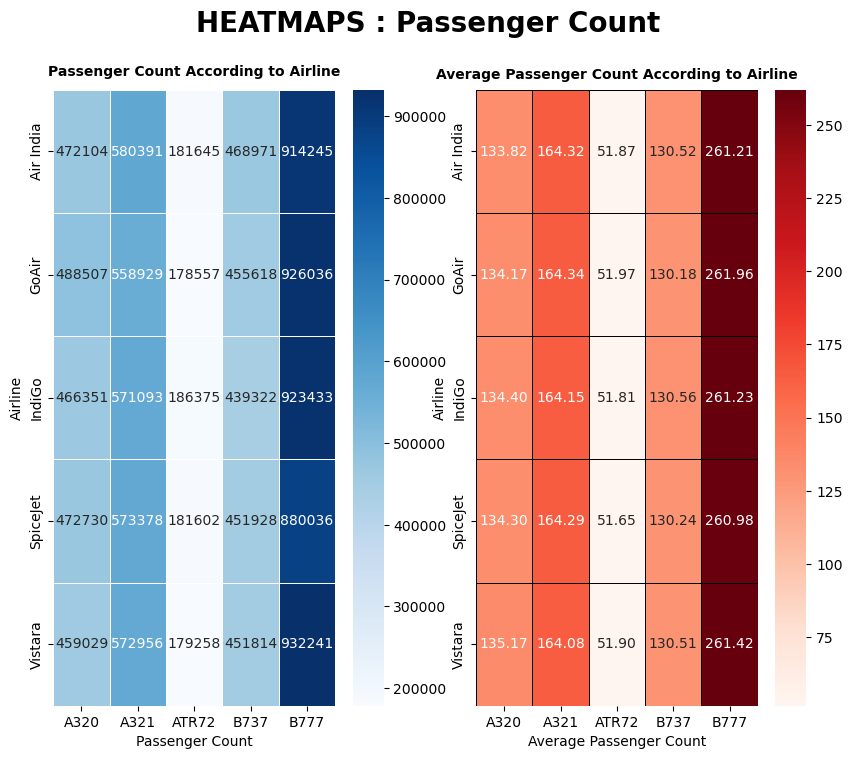

In [37]:
pass_count=pass_dept_airtype_count.pivot(index="Airline",columns="Aircraft_Type",values="passenger_count")
avg_count=pass_dept_airtype_count.pivot(index="Airline",columns="Aircraft_Type",values="average_passenger")
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(10,8))
sns.heatmap(pass_count,ax=ax1,annot=True,fmt="d",cmap="Blues",linecolor="White",linewidth=0.5)
sns.heatmap(avg_count,ax=ax2,annot=True,fmt=".2f",cmap="Reds",linecolor="black",linewidth=0.5)

ax1.set_xlabel("Passenger Count")
ax2.set_xlabel("Average Passenger Count")

ax1.set_ylabel("Airline")
ax2.set_ylabel("Airline")

ax1.set_title("Passenger Count According to Airline",fontsize=10,fontweight="bold",pad=10)
ax2.set_title("Average Passenger Count According to Airline",fontsize=10,fontweight="bold",pad=8)

plt.suptitle("HEATMAPS : Passenger Count",fontsize=20,fontweight="bold")
plt.show()

In [38]:
def tdays(a):
    tm=a.split(",")[1].split(":")
    dt=round((int(tm[0])*3600+int(tm[1])*60+int(tm[2]))/86400,2)
    return int(a.split(",")[0].split()[0])+dt

In [39]:
total_flight_time=total_flight_time.unstack().reset_index()
total_flight_time[1]=total_flight_time[0].apply(tdays)

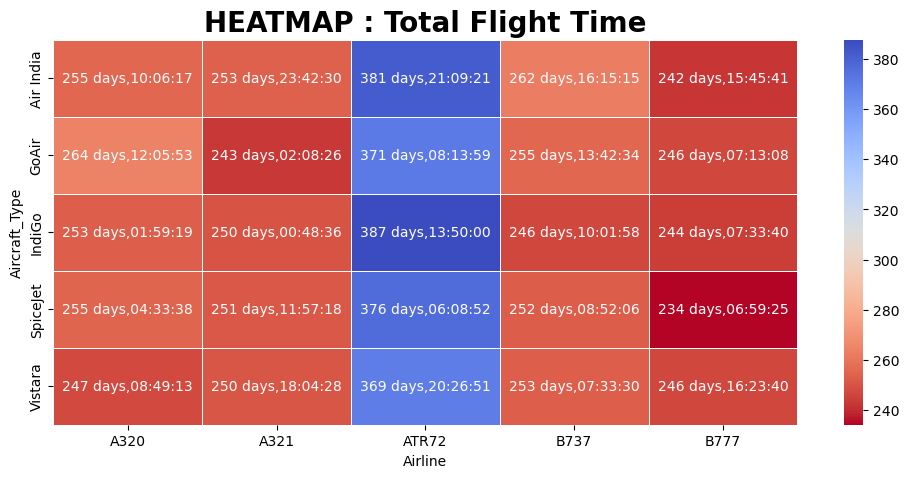

In [40]:
plt_df=total_flight_time.pivot_table(index="level_1",columns="level_0",values=1,fill_value=0)
annot_df=total_flight_time.pivot(index="level_1",columns="level_0",values=0)
plt.figure(figsize=(12,5))
sns.heatmap(plt_df,annot=annot_df,fmt="",cmap="coolwarm_r",linecolor="white",linewidth=0.5)
plt.xlabel("Airline")
plt.ylabel("Aircraft_Type")
plt.title("HEATMAP : Total Flight Time",fontsize="20",fontweight="bold")
plt.show()

In [41]:
Aircraft_profit

,B777,ATR72,A320,B737,A321
Air India,-1366226.72,1682036.26,-806848.53,-1245061.92,404489.57
GoAir,-5414992.59,-1518661.85,-4353058.54,-4549696.61,-3304746.61
IndiGo,-2660507.15,710662.23,-1996025.99,-2275904.07,-956884.48
SpiceJet,-3882923.60,-327114.82,-3112933.18,-3335482.44,-2279451.20
Vistara,1248304.81,4053470.97,1266284.87,971867.53,2962537.56


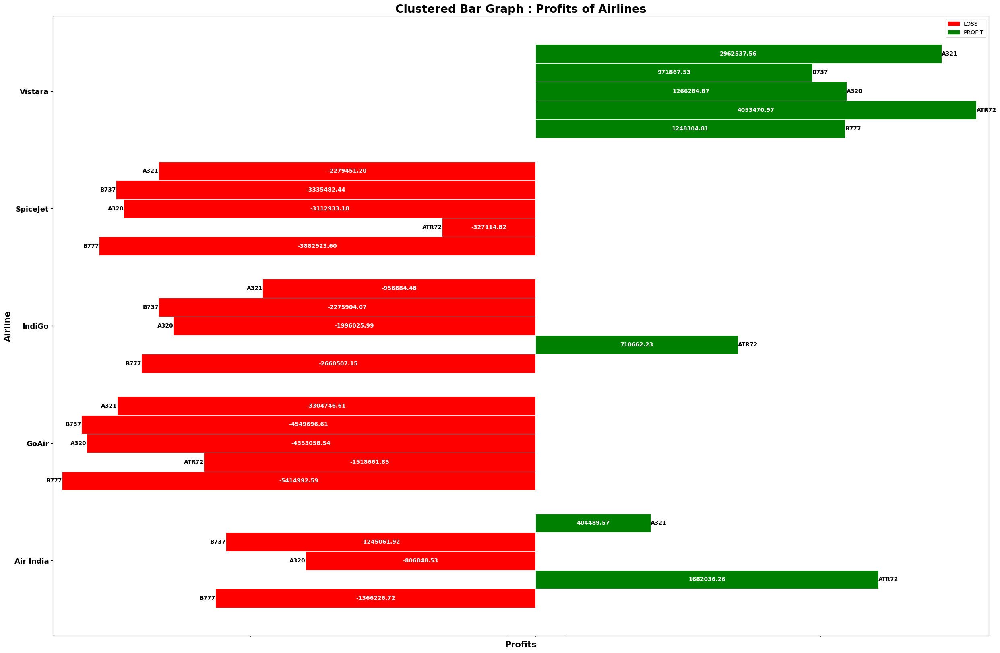

In [42]:
air=Aircraft_profit.index
aircrafts=Aircraft_profit.columns
y=np.arange(len(air))
width=0.8
fig,ax=plt.subplots(figsize=(30,20))
bar_width=width/len(aircrafts)
for i,airline in enumerate(air):
    start=y[i]-width/2+bar_width/2
    for j,aircraft in enumerate(aircrafts):
        val=Aircraft_profit.loc[airline,aircraft]
        ypo=start+j*bar_width
        b1=ax.barh(ypo,val,bar_width,color="green" if val>0 else "red",linewidth=0.8,edgecolor="white")
        ax.bar_label(b1,fmt="%.2f",label_type="center",color="white",fontweight="bold")
        if val>0:
            ax.text(val+10,ypo,aircraft,ha="left",va="center",fontweight="bold")
        elif val<0: 
            ax.text(val-10,ypo,aircraft,ha="right",va="center",fontweight="bold")
ax.set_xscale("symlog",linthresh=1e6)
ax.set_xticks([])
ax.set_yticks(y)
ax.set_yticklabels(air,fontsize=13,fontweight="bold")
ax.set_xlabel("Profits",fontsize=15,fontweight="bold")
ax.set_ylabel("Airline",fontsize=15,fontweight="bold")
ax.set_title("Clustered Bar Graph : Profits of Airlines",fontsize=20,fontweight="bold")
plt.legend(handles=[Patch(color="red",label="LOSS"),Patch(color="green",label="PROFIT")],bbox_to_anchor=(1,1))
plt.show()


In [43]:
Aircraft_Time_range_delay_count

,Airline,Aircraft_Type,Time_Range,Flight_Count
0,Air India,B777,"(00:00:00, 00:09:59)",1108
1,Air India,B777,"(00:10:00, 00:19:59)",711
2,Air India,B777,"(00:20:00, 00:29:59)",608
3,Air India,B777,"(00:30:00, 00:39:59)",474
4,Air India,B777,"(00:40:00, 00:49:59)",254
...,...,...,...,...
291,Vistara,ATR72,"(01:10:00, 01:19:59)",63
292,Vistara,ATR72,"(01:20:00, 01:29:59)",34
293,Vistara,ATR72,"(01:30:00, 01:39:59)",18
294,Vistara,ATR72,"(01:40:00, 01:49:59)",4


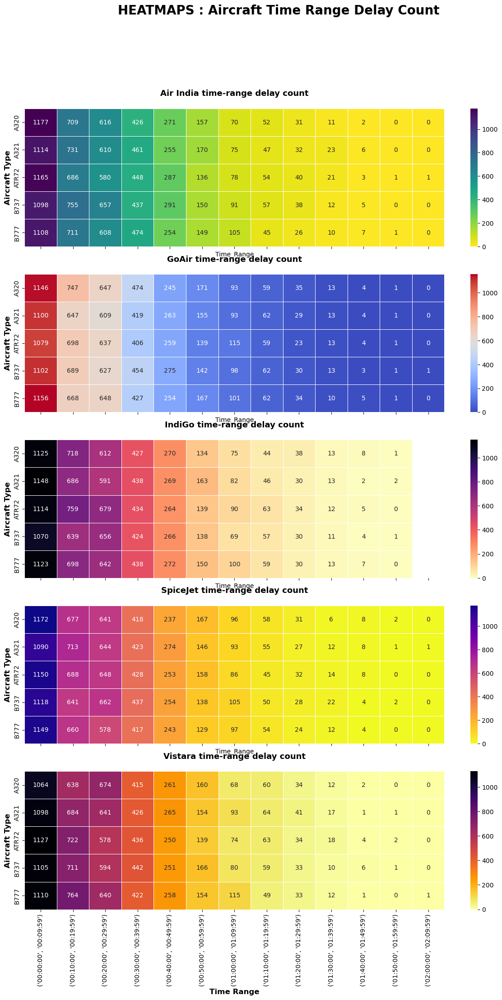

In [44]:
air=Aircraft_Time_range_delay_count["Airline"].unique()
fig,axes=plt.subplots(len(air),1,figsize=(15,23),sharex=True)
clrmap=["viridis_r","coolwarm","magma_r","plasma_r","inferno_r"]
for i,airline in enumerate(air):
    axs=axes[i]
    sub=Aircraft_Time_range_delay_count[Aircraft_Time_range_delay_count["Airline"]==airline].drop("Airline",axis=1).pivot_table(index="Aircraft_Type",
                                                                                                                                columns="Time_Range",
                                                                                                                                values="Flight_Count",fill_value=0).astype("int")
    sns.heatmap(sub,annot=True,fmt="d",ax=axs,cmap=clrmap[i],linecolor="white",linewidth=0.5)
    axs.set_title(f"{airline} time-range delay count",fontsize=13,fontweight="bold",pad=20)
    axs.set_ylabel("Aircraft Type",fontsize=12,fontweight="bold")
axs.set_xlabel("Time Range",fontsize=12,fontweight="bold")
plt.suptitle("HEATMAPS : Aircraft Time Range Delay Count",fontsize=20,fontweight="bold")
plt.show()

In [45]:
DFC

day,1,2,3,4,5,6,7,8,9,10,...,22,23,24,25,26,27,28,29,30,31
month,,,,,,,,,,,,,,,,,,,,,
January,239,221,248,227,246,236,258,219,237,247,...,256,222,235,251,217,223,227,211,234,251
February,236,211,250,236,263,261,209,248,253,221,...,240,246,235,226,244,235,267,0,0,0
March,238,210,242,255,249,243,268,232,257,245,...,213,259,263,221,259,256,237,237,227,256
April,232,220,215,250,244,241,245,244,257,248,...,268,222,216,253,225,252,248,233,239,0
May,245,240,254,225,245,234,238,232,218,221,...,240,233,250,218,231,211,232,239,250,214
June,224,258,245,244,276,228,263,241,262,217,...,213,237,246,239,251,249,281,241,218,0
July,225,229,228,260,271,247,236,245,232,223,...,251,269,229,234,237,247,216,225,244,229
August,232,242,257,254,231,244,224,227,250,246,...,260,232,214,254,214,234,240,216,232,239
September,240,233,243,234,248,247,256,266,240,228,...,301,246,219,248,235,260,225,258,221,0


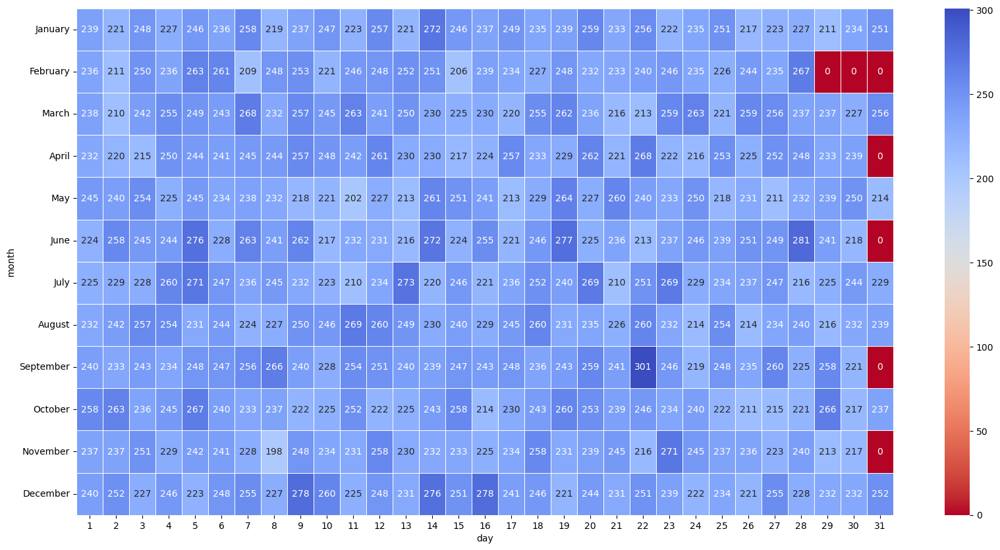

In [46]:
plt.figure(figsize=(20,10))
sns.heatmap(DFC,annot=True,fmt="d",cmap="coolwarm_r",linecolor="white",linewidth=0.5)
plt.show()

In [47]:
ADPC

day,Airline,month,1,2,3,4,5,6,7,8,...,22,23,24,25,26,27,28,29,30,31
0,Air India,January,6480,7366,7229,6906,5964,6923,9718,6946,...,7794,5975,6882,8075,6492,7984,5398,6715,8136,7004
1,Air India,February,6998,6873,8658,4931,8256,8157,6184,4609,...,7705,8851,9460,5402,6174,8976,8167,0,0,0
2,Air India,March,5490,7089,7666,6171,5985,8384,9857,5909,...,6766,8063,6786,5654,5883,7459,8425,7853,8389,7217
3,Air India,April,6559,5649,5606,7316,7216,8271,6828,7005,...,7008,6671,5470,7477,6436,10110,7406,8581,7003,0
4,Air India,May,6349,7017,8891,5389,8944,4799,5818,4805,...,6888,5943,7676,7629,7169,6630,7378,6567,8440,5754
5,Air India,June,3370,7782,7683,7962,7990,7072,8336,7776,...,6761,6637,7149,6648,7231,9266,8725,7313,6507,0
6,Air India,July,4988,6802,7875,9186,8350,7616,7879,6963,...,8473,6456,5320,8136,8611,7282,4979,6157,8436,6004
7,Air India,August,5305,6951,7352,9203,7351,7811,6619,8544,...,7369,4777,6618,8720,7525,6409,8709,7431,8080,8064
8,Air India,September,6946,7146,9174,7782,6988,7206,8953,7788,...,9878,8509,7806,6191,8670,6947,8908,7615,6328,0
9,Air India,October,9996,7622,6713,7828,8457,7087,7680,4670,...,8076,6874,7682,7514,6183,7368,6777,7183,7513,7130


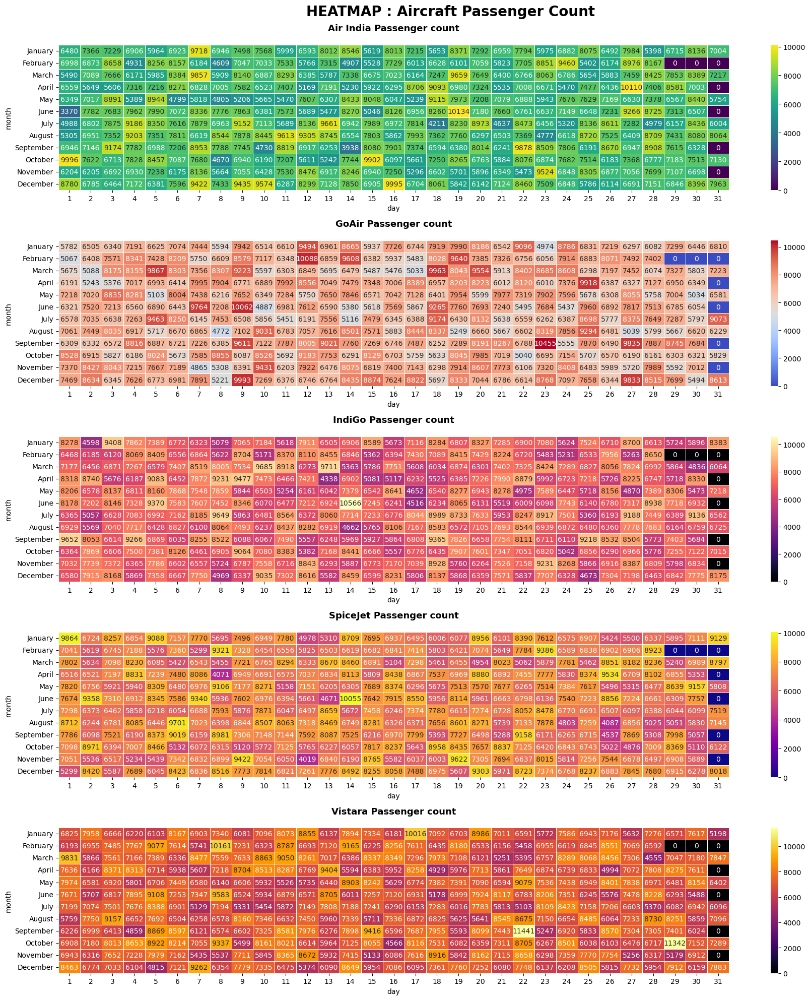

In [48]:
air=ADPC["Airline"].unique()
fig,axes=plt.subplots(len(air),1,figsize=(18,20))
clrmap=["viridis","coolwarm","magma","plasma","inferno"]
for i,airline in enumerate(air):
    axs=axes[i]
    sub=ADPC[ADPC["Airline"]==airline].drop("Airline",axis=1).set_index("month")
    sns.heatmap(sub,annot=True,fmt="d",ax=axs,cmap=clrmap[i],linecolor="white",linewidth=0.5)
    axs.set_title(f"{airline} Passenger count",fontsize=13,fontweight="bold",pad=20)
plt.suptitle("HEATMAP : Aircraft Passenger Count",fontsize=20,fontweight="bold",y=0.99)
plt.tight_layout()
plt.show()

In [49]:
AADPC

day,Airline,Aircraft_Type,month,1,2,3,4,5,6,7,...,22,23,24,25,26,27,28,29,30,31
0,Air India,A320,January,890,1402,1457,892,1598,1270,1721,...,1087,899,1856,1098,1153,1400,819,1653,1717,1025
1,Air India,A320,February,1474,918,1808,630,1700,1671,1139,...,1152,1599,1219,1205,1192,2001,1169,0,0,0
2,Air India,A320,March,1020,638,1027,652,1623,1802,1731,...,1318,1071,1652,1349,583,1156,1432,1299,1793,1000
3,Air India,A320,April,1545,1043,632,667,2310,1262,1360,...,986,1731,1326,665,1009,2820,1942,1483,1561,0
4,Air India,A320,May,945,675,1836,1501,1655,704,1642,...,1056,1125,1559,1246,1223,1002,1871,1085,1261,977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,Vistara,B777,August,2298,2614,4158,3004,2710,2844,1457,...,3217,2102,3055,4069,2085,2789,3621,3781,1850,1923
296,Vistara,B777,September,2085,2232,1717,1359,3751,3543,1330,...,4122,1485,2014,1040,3662,3326,3541,2865,1717,0
297,Vistara,B777,October,2375,1331,3583,4037,3360,3236,2560,...,3698,1671,2294,1927,2482,2319,2377,5375,3732,2813
298,Vistara,B777,November,2383,2421,2934,1762,2168,1394,1768,...,3479,1562,2093,2508,2128,1787,2157,1603,2447,0


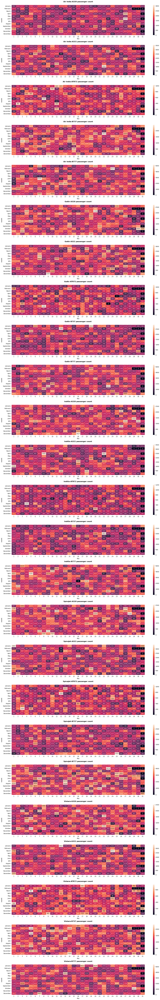

In [50]:
air=AADPC["Airline"].unique()
aircrafts=AADPC["Aircraft_Type"].unique()
fig,axes=plt.subplots(len(air)*len(aircrafts),1,figsize=(18,20*len(air)))
q=0
for i,airline in enumerate(air):
    sub_airline=AADPC[AADPC["Airline"]==airline].drop("Airline",axis=1)
    for j,aircraft in enumerate(Aircrafts):
        ax=axes[q]
        sub=sub_airline[sub_airline["Aircraft_Type"]==aircraft].drop("Aircraft_Type",axis=1).set_index("month")
        sns.heatmap(sub,annot=True,fmt="d",ax=ax,linecolor="white",linewidth=0.5)
        ax.set_title(f"{airline}-{aircraft} passenger count",fontweight="bold",pad=20)
        q+=1
plt.tight_layout()
plt.show()

In [51]:
Aircraft_Destination_count

,Airline,Aircraft_Type,Destination,flight_count
0,Air India,A320,AMD,454
1,Air India,A320,BLR,435
2,Air India,A320,BOM,430
3,Air India,A320,CCU,460
4,Air India,A320,DEL,419
...,...,...,...,...
195,Vistara,B777,CCU,429
196,Vistara,B777,DEL,436
197,Vistara,B777,HYD,432
198,Vistara,B777,MAA,440


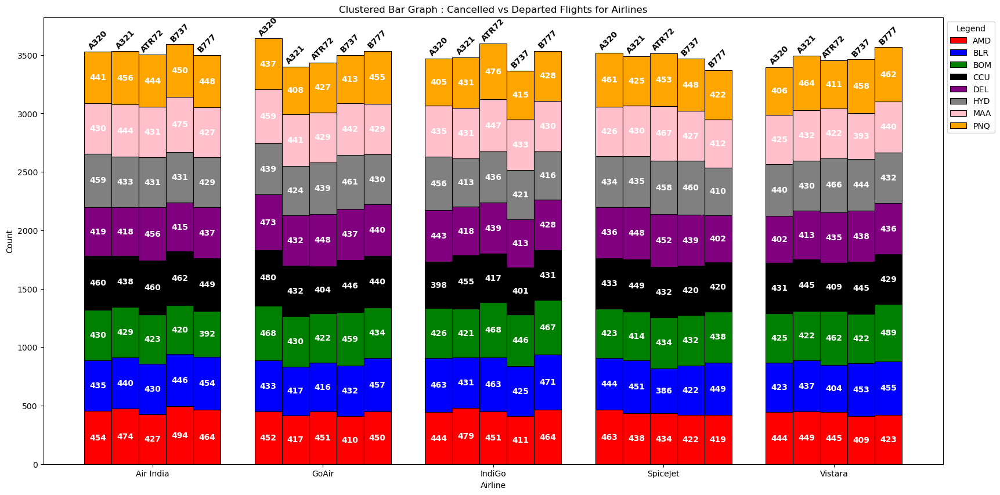

In [84]:
air=Aircraft_Destination_count["Airline"].unique()
aircrafts=Aircraft_Destination_count["Aircraft_Type"].unique()
x=np.arange(len(air))
Destinations=Aircraft_Destination_count["Destination"].unique()
color=["red","blue","green","black","purple","gray","pink","orange"]
fig,ax=plt.subplots(figsize=(20,10))
width=0.8
barwidth=width/len(aircrafts)

for i,airline in enumerate(air):
    sub=Aircraft_Destination_count[Aircraft_Destination_count["Airline"]==airline].pivot_table(index="Aircraft_Type",
                                                                                     columns="Destination",
                                                                                     values="flight_count").astype("int")
    
    start=x[i]-width/2+barwidth/2
    for j,aircraft in enumerate(aircrafts):
        xpo=start+j*barwidth
        bottom=0
        for k,Destination in enumerate(Destinations):
            val=sub.loc[aircraft,Destination]
            b1=ax.bar(xpo,val,barwidth,bottom=bottom,color=color[k],label=Destination if (i==0 and j==0) else None,edgecolor="black",linewidth=0.8)
            bottom+=val
            ax.bar_label(b1,label_type="center",color="white",fontweight="bold")
        ax.text(xpo,bottom+10,aircraft,ha="center",va="bottom",fontweight="bold",rotation=45)
ax.set_xticks(x)
ax.set_xticklabels(air)
plt.xlabel("Airline")
plt.ylabel("Count")
plt.title("Clustered Bar Graph : Cancelled vs Departed Flights for Airlines")
plt.legend(title="Legend",bbox_to_anchor=(1,1))
plt.show()
